In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from astropy.cosmology import Planck13 as cosmo
from spec_exam import Gen_spec, Calzetti
from spec_extract import Scale_spectra
from spec_tools import Photometry, Median_w_Error_cont, Median_w_Error, Likelihood_contours
import seaborn as sea
import re
from grizli import model
from astropy.io import fits
from astropy.table import Table
from grizli import model as griz_model
from scipy.interpolate import interp1d
from spec_tools import Get_Sensitivity, Scale_model
import pysynphot as S
from time import time
import os
from glob import glob
sea.set(style='white')
sea.set(style='ticks')
sea.set_style({'xtick.direct'
               'ion': 'in','xtick.top':True,'xtick.minor.visible': True,
               'ytick.direction': "in",'ytick.right': True,'ytick.minor.visible': True})
cmap = sea.cubehelix_palette(12, start=2, rot=.2, dark=0, light=1.0, as_cmap=True)

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

### set home for files
hpath = os.environ['HOME'] + '/'

In [7]:
galDB = pd.read_pickle('../dataframes/galaxy_database.pkl')
BFs = pd.read_pickle('../dataframes/BF_fit_all.pkl')
lwa = np.load('../data/light_weight_scaling_3.npy')
metal=np.round(np.arange(0.002,0.031,0.001),3)
age=np.round(np.arange(.5,6.1,.1),1)
tau=[0,8.0, 8.3, 8.48, 8.6, 8.7, 8.78, 8.85, 8.9, 8.95, 9.0, 9.04, 9.08, 9.11, 9.15, 9.18, 9.2, 9.23, 9.26, 9.28,
     9.3, 9.32, 9.34, 9.36, 9.38, 9.4, 9.41, 9.43, 9.45, 9.46, 9.48]
M,A=np.meshgrid(metal,age)

In [8]:
bfZ, bfd, bft, bftau, bfz, gids = [[],[],[],[],[],[]]

for i in BFs.index:
    bfZ.append(BFs.bfZ[i])
    bft.append(BFs.bft[i])
    bftau.append(BFs.bftau[i])
    bfz.append(np.round(BFs.bfz[i],3))
    bfd.append(np.round(BFs.bfd[i],1))
    gids.append(int(BFs.gids[i]))
    
bfZ = np.array(bfZ)
bft = np.array(bft)
bftau = np.array(bftau)
bfz = np.array(bfz)
bfd = np.array(bfd)
gids = np.array(gids)

In [124]:
# galDB['Z'] = np.zeros(len(galDB.index))
# galDB['Z_l'] = np.zeros(len(galDB.index))
# galDB['Z_h'] = np.zeros(len(galDB.index))
# galDB['Zx'] = np.zeros(len(galDB.index))
# galDB['Zx_l'] = np.zeros(len(galDB.index))
# galDB['Zx_h'] = np.zeros(len(galDB.index))

# galDB['t'] = np.zeros(len(galDB.index))
# galDB['t_l'] = np.zeros(len(galDB.index))
# galDB['t_h'] = np.zeros(len(galDB.index))
# galDB['tx'] = np.zeros(len(galDB.index))
# galDB['tx_l'] = np.zeros(len(galDB.index))
# galDB['tx_h'] = np.zeros(len(galDB.index))

# galDB['tau'] = np.zeros(len(galDB.index))
# galDB['tau_l'] = np.zeros(len(galDB.index))
# galDB['tau_h'] = np.zeros(len(galDB.index))
# galDB['taux'] = np.zeros(len(galDB.index))
# galDB['taux_l'] = np.zeros(len(galDB.index))
# galDB['taux_h'] = np.zeros(len(galDB.index))

# galDB['d'] = np.zeros(len(galDB.index))
# galDB['d_l'] = np.zeros(len(galDB.index))
# galDB['d_h'] = np.zeros(len(galDB.index))
# galDB['dx'] = np.zeros(len(galDB.index))
# galDB['dx_l'] = np.zeros(len(galDB.index))
# galDB['dx_h'] = np.zeros(len(galDB.index))

In [6]:
for i in galDB.index:
    Z,PZ = np.load('../data/posteriors/fit_all_{0}_{1}_Z_pos.npy'.format(galDB.field[i],galDB.ids[i]))
    t,Pt = np.load('../data/posteriors/fit_all_{0}_{1}_t_pos.npy'.format(galDB.field[i],galDB.ids[i]))
    ult,Ptau = np.load('../data/posteriors/fit_all_{0}_{1}_tau_pos.npy'.format(galDB.field[i],galDB.ids[i]))
    z,Pz = np.load('../data/posteriors/fit_all_{0}_{1}_rs_pos.npy'.format(galDB.field[i],galDB.ids[i]))
    d,Pd = np.load('../data/posteriors/fit_all_{0}_{1}_d_pos.npy'.format(galDB.field[i],galDB.ids[i]))
    
#     medZ,mler,mher = Median_w_Error_cont(PZ,Z)
#     galDB['Zx'][i] = medZ
#     galDB['Zx_l'][i] = mler
#     galDB['Zx_h'][i] = mher
    
#     medZ,mler,mher = Median_w_Error(PZ,Z)
#     galDB['Z'][i] = medZ
#     galDB['Z_l'][i] = mler
#     galDB['Z_h'][i] = mher
    
#     medt,mler,mher = Median_w_Error_cont(Pt,t)
#     galDB['tx'][i] = medt
#     galDB['tx_l'][i] = mler
#     galDB['tx_h'][i] = mher
    
#     medt,mler,mher = Median_w_Error(Pt,t)
#     galDB['t'][i] = medt
#     galDB['t_l'][i] = mler
#     galDB['t_h'][i] = mher
    
#     medtau,mler,mher = Median_w_Error_cont(Ptau,ult)
#     galDB['taux'][i] = medtau
#     galDB['taux_l'][i] = mler
#     galDB['taux_h'][i] = mher
    
#     medtau,mler,mher = Median_w_Error(Ptau,ult)
#     galDB['tau'][i] = medtau
#     galDB['tau_l'][i] = mler
#     galDB['tau_h'][i] = mher
    
#     medd,mler,mher = Median_w_Error_cont(Pd,d)
#     galDB['dx'][i] = medd
#     galDB['dx_l'][i] = mler
#     galDB['dx_h'][i] = mher
    
#     medd,mler,mher = Median_w_Error(Pd,d)
#     galDB['d'][i] = medd
#     galDB['d_l'][i] = mler
#     galDB['d_h'][i] = mher
    
#     galDB['z_grism'][i] = z[Pz == max(Pz)][0]
    
#     plt.figure(figsize=[15,8])
#     plt.subplot(gs[1,0])
#     plt.plot(Z,PZ)
#     plt.axvline(galDB.Z[i])
# #     plt.axvline(medZ,color='r')
    
#     plt.subplot(gs[1,1])
#     plt.plot(t,Pt)
#     plt.axvline(galDB.t[i])
# #     plt.axvline(medt,color='r')

#     plt.subplot(gs[1,2])
#     plt.plot(ult,Ptau)
#     plt.axvline(galDB.tau[i])
# #     plt.axvline(medtau,color='r')

#     plt.subplot(gs[1,3])
#     plt.plot(z,Pz)
#     plt.axvline(galDB.z_grism[i])
    
#     plt.subplot(gs[1,4])
#     plt.plot(d,Pd)
#     plt.axvline(galDB.d[i])
#     plt.axvline(medd,color='r')

    # plt.savefig('../plots/example_fit.png',bbox_inches = 'tight')

In [4]:
data_path = '../data/'
model_path = hpath + 'fsps_models_for_fit/fsps_spec/'
chi_path = '../chidat/'
spec_path = '../spec_files/'
beam_path = '../beams/'
template_path = '../templates/'
out_path = '../data/posteriors/'
phot_path = '../phot/'

"""
FUNCTIONS:
-Calzetti_low
-Calzetti_hi
-Calzetti

CLASSES:
-Gen_spec
--Sim_spec_indv
--Sim_spec_mult
--Sim_spec_mult_point
--Sim_spec
--Sim_phot_mult
--Sim_phot
--Sim_all
"""

def L_nu_per_M(l_aa, lam, z, Av, m_star):
    c = 3E18 # speed of light in angstrom
    lam_0 = lam / (1 + z) # restframe wavelenth in angstrom
    dust = 10**(-0.4*Av)
    return ((lam_0**2)/(c * m_star)) * l_aa * dust * 3.839E33

def F_nu_per_M(l_aa, lam, z, Av, m_star):
    conv = 3.086E24 # conversion of Mpc to cm
    D_l = cosmo.luminosity_distance(z).value # in Mpc
    return (1 + z) * L_nu_per_M(l_aa, lam, z, Av, m_star)  / (4 * np.pi * (D_l*conv)**2)

def F_lam_per_M(l_aa, lam, z, Av, m_star):
    c = 3E18 # speed of light in angstrom
    return (c / lam**2) * F_nu_per_M(l_aa, lam, z, Av, m_star)

def Get_mass(gwv, gfl, ger, Z, t, z, Av):
    sp = fsps.StellarPopulation(imf_type=1, tpagb_norm_type=0, zcontinuous=1, logzsol=np.log10(Z / 0.019), sfh=0)
    wave,flux=np.array(sp.get_spectrum(tage=t,peraa=True))
    
    fl_m = F_lam_per_M(flux, wave * (1 + z), z, Av, sp.stellar_mass)
    
    IDX = [U for U in range(len(gwv)) if 8000 < gwv[U] < 11300]
    return np.log10(Scale_model(gfl[IDX],ger[IDX],interp1d(wv,fl_m)(gwv[IDX])))

def Calzetti_low(Av,lam):
    lam = lam * 1E-4
    Rv=4.05
    k = 2.659*(-2.156 +1.509/(lam) -0.198/(lam**2) +0.011/(lam**3)) + Rv
    cal = 10**(-0.4*k*Av/Rv)
    return cal

def Calzetti_hi(Av,lam):
    lam = lam * 1E-4
    Rv=4.05
    k = 2.659*(-1.857 +1.04/(lam)) + Rv
    cal = 10**(-0.4*k*Av/Rv)    
    
    return cal

def Calzetti(Av,lam):
    dust = Calzetti_low(Av,lam)
    dust2 = Calzetti_hi(Av,lam)
    
    for ii in range(len(dust)):
        if lam[ii] > 6300:
            dust[ii]=dust2[ii] 
    
    return dust

In [8]:
def Plot_L(field, gid, bfZ, bft, bftau, bfz, bfd):
    ##set spec
    sp = Gen_spec(field, gid, bfz, glob('../beams/*{0}*.g102.A.fits'.format(gid))[0],
                  glob('../beams/*{0}*.g141.A.fits'.format(gid))[0], g102_lims=[8500,11300])   
    
    ##set age
#     LWA = lwa[metal == bfZ].T[tau == bftau][0].T[0].T
#     mt = age[np.round(LWA,1) == galDB.t[idx]][0] 
    mt = bft
    if bftau == 0.0:
        mtau = int(0)
    else:
        mtau = bftau
            
    sp.Scale_flux(bfZ, mt, mtau, bfz, bfd)
    sp.Sim_all(bfZ, mt, mtau, Av=bfd)
    
    ##read posteriors
    P = np.load('../data/posteriors/fit_all_2_{0}_{1}_tZ_pos.npy'.format(field,gid))
    Z,PZ = np.load('../data/posteriors/fit_all_2_{0}_{1}_Z_pos.npy'.format(field,gid))
    t,Pt = np.load('../data/posteriors/fit_all_2_{0}_{1}_t_pos.npy'.format(field,gid))
    ult,Ptau = np.load('../data/posteriors/fit_all_2_{0}_{1}_tau_pos.npy'.format(field,gid))
    z,Pz = np.load('../data/posteriors/fit_all_2_{0}_{1}_rs_pos.npy'.format(field,gid))
    d,Pd = np.load('../data/posteriors/fit_all_2_{0}_{1}_d_pos.npy'.format(field,gid))
    
    ##set levels for 2d plot
    onesig,twosig = Likelihood_contours(age,metal,P)
    levels = np.array([twosig,onesig])
    
    ##initialize gridspeec
    gs = GridSpec(3,5,hspace=0.5)
    
    ##set limits on top plot
    xmin = sp.Bwv_rf[0]-100
    xmax = sp.Rwv_rf[-1]+100
    ymin = np.min(np.append(sp.Bflx[sp.Bflx**2 > 0],sp.Rflx[sp.Rflx**2 > 0])) * 1.1 * 1E18
    ymax = np.max(np.append(sp.Bflx[sp.Bflx**2 > 0],sp.Rflx[sp.Rflx**2 > 0])) * 1.1 * 1E18
    
    fig = plt.figure(figsize=[15,15])
    
    ##grism spectra
    plt.subplot(gs[0,:])
    plt.errorbar(sp.Bwv_rf,sp.Bflx*1E18,sp.Berr*1E18,
                linestyle='None', marker='o', markersize=3, color='#377eb8')
    plt.errorbar(sp.Rwv_rf,sp.Rflx*1E18,sp.Rerr*1E18,
                linestyle='None', marker='o', markersize=3, color='#e41a1c')
    plt.plot(sp.Bwv_rf,sp.Bmfl*1E18,'k',linewidth=3)
    plt.plot(sp.Rwv_rf,sp.Rmfl*1E18,'k',linewidth=3)
    plt.errorbar(sp.Pwv_rf,sp.Pflx*1E18,sp.Perr*1E18,
                                 linestyle='None', marker='p', markersize=15, color='#984ea3')
    plt.xlim(xmin,xmax)
    plt.ylim(ymin,ymax)
    plt.ylabel('F$_\lambda$',size=20)
    plt.xlabel('Restframe Wavelength ($\\rm \AA$)',size=20)
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.axvline(3934.777,linestyle='--', alpha=.3)
    plt.axvline(3969.588,linestyle='--', alpha=.3)
    plt.axvline(4102.89,linestyle='--', alpha=.3)
    plt.axvline(4305.61,linestyle='--', alpha=.3)
    plt.axvline(4341.68,linestyle='--', alpha=.3)
    plt.axvline(4862.68,linestyle='--', alpha=.3)
    plt.axvline(5176.7,linestyle='--', alpha=.3)
    plt.axvline(5895.6,linestyle='--', alpha=.3)
    plt.axvline(6564,linestyle='--', alpha=.3)
    
    if xmin < 3934.777 < xmax:
        plt.text(3800,ymax*1.05,'Ca HK',fontsize=20)
        
    if xmin < 4102 < xmax:
        plt.text(4070,ymax*1.05,'H$\delta$',fontsize=20)
    
    if xmin < 4305 < xmax:
        plt.text(4240,ymax*1.05,'G+H$\gamma$',fontsize=20)
    
    if xmin < 4860 < xmax:
        plt.text(4830,ymax*1.05,'H$\\beta$',fontsize=20)
    
    if xmin < 5170 < xmax:
        plt.text(5120,ymax*1.05,'Mgb',fontsize=20)

    if xmin < 5895 < xmax:
        plt.text(5850,ymax*1.05,'Na',fontsize=20)
    plt.axvspan(3910, 3980, color='k', alpha=.1)
    plt.axvspan(3980, 4030, color='k', alpha=.1)
    plt.axvspan(4080, 4120, color='k', alpha=.1)
    plt.axvspan(4250, 4380, color='k', alpha=.1)
    plt.axvspan(4810, 4910, color='k', alpha=.1)
    plt.axvspan(5120, 5240, color='k', alpha=.1)
    plt.axvspan(5840, 5950, color='k', alpha=.1)

    ##all data plot
    plt.subplot(gs[1,:-1])
    plt.errorbar(np.log10(sp.Bwv_rf),sp.Bflx*1E18,sp.Berr*1E18,
                linestyle='None', marker='o', markersize=3, color='#377eb8', alpha=.3)
    plt.errorbar(np.log10(sp.Rwv_rf),sp.Rflx*1E18,sp.Rerr*1E18,
                linestyle='None', marker='o', markersize=3, color='#e41a1c', alpha=.3)

    plt.errorbar(np.log10(sp.Pwv_rf),sp.Pflx*1E18,sp.Perr*1E18,
                                 linestyle='None', marker='p', markersize=10, color='#984ea3')
    IDb = [U for U in range(len(sp.model_wave)) if sp.model_wave[U] < sp.Bwv_rf[0]]
    IDr = [U for U in range(len(sp.model_wave)) if sp.model_wave[U] > sp.Rwv_rf[-1]]

    plt.plot(np.log10(sp.model_wave[IDb]),sp.S_model_flux[IDb]*1E18,'k',ms=10,zorder =5,alpha=0.5)
    plt.plot(np.log10(sp.model_wave[IDr]),sp.S_model_flux[IDr]*1E18,'k',ms=10,zorder =5,alpha=0.5)

    plt.plot(np.log10(sp.Bwv_rf),sp.Bmfl*1E18,'k',linewidth=3)
    plt.plot(np.log10(sp.Rwv_rf),sp.Rmfl*1E18,'k',linewidth=3)
    plt.xticks(np.log10([1000,2500,5000,7500,10000,25000]),[1000,2500,5000,7500,10000,25000])
    plt.minorticks_off()
    plt.xlim(3,np.log10(50000))
    plt.ylabel('F$_\lambda$',size=20)
    plt.xlabel('Restframe Wavelength ($\\rm \AA$)',size=20)
    plt.tick_params(axis='both', which='major', labelsize=20)
    
    ##2d likelihood plot
    ax = plt.subplot(gs[1,-1])
    plt.contour(M,A,P,levels,colors='k',linewidths=2)
    plt.contourf(M,A,P,40,cmap=cmap)
    plt.axis([0,0.03,0,6])
    plt.xlabel('Metallicity (Z$_\odot$)',size=20)
    plt.ylabel('Light Weighted Age (Gyr)',size=20)
    ax.yaxis.set_label_position("right")
    plt.gca().tick_params(axis='y',labelleft='off',labelright='on')
    plt.tick_params(axis='both', which='major', labelsize=20)
    plt.xticks([0.0095 , 0.019  , 0.0285 ],[.5,1.0,1.5])
    plt.text(.005,5,'{0}-{1}'.format(field,gid), fontsize=20)

    ##1d posterior plots
    plt.subplot(gs[2,0])
    plt.plot(Z/0.019,PZ)
    plt.axvline(bfZ/0.019)
    plt.title('Z = {0}'.format(np.round(bfZ/0.019,2)),fontsize=15)
    plt.xlabel('Metallicity ($Z/Z_\odot$)',size=15)
    plt.tick_params(axis='both', which='major', labelsize=15)
    
    plt.subplot(gs[2,1])
    plt.plot(t,Pt)
    plt.axvline(bft)
    plt.xlabel('Age (Gyr)',size=15)
    plt.title('t = {0}'.format(bft),fontsize=15)
    plt.tick_params(axis='both', which='major', labelsize=15)
    
    plt.subplot(gs[2,2])
    plt.plot(ult,Ptau)
    plt.axvline(ult[tau == bftau])
    plt.xlabel('SFH (Gyr)',size=15)
    plt.title('$\\tau$ = {0}'.format(np.round(ult[tau == bftau][0],1)),fontsize=15)
    plt.tick_params(axis='both', which='major', labelsize=15)
    
    plt.subplot(gs[2,3])
    plt.plot(z,Pz)
    plt.axvline(bfz)
    plt.xlabel('Redshift (z)',size=15)
    plt.title('z = {0}'.format(np.round(bfz,3)),fontsize=15)
    plt.tick_params(axis='both', which='major', labelsize=15) 

    plt.subplot(gs[2,4])
    plt.plot(d,Pd)
    plt.axvline(bfd)
    plt.xlabel('Dust (A$_v$)',size=15)
    plt.title('A$_v$ = {0}'.format(np.round(bfd,1)),fontsize=15)
    plt.tick_params(axis='both', which='major', labelsize=15)
    
    plt.savefig('../plots/Likelihoods/{0}-{1}.png'.format(field,gid),bbox_inches = 'tight')


/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.8.0_4_g1153432-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3452: RuntimeWarning: invalid value encountered in sqrt
  resid = np.abs(self.scif - self.flat_flam)*np.sqrt(self.ivarf)
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.8.0_4_g1153432-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3457: RuntimeWarning: invalid value encountered in sqrt
  contam_mask = ((self.contam*np.sqrt(self.ivar) > contam_sn_mask[0]) &
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.8.0_4_g1153432-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:3458: RuntimeWarning: invalid value encountered in sqrt
  (self.model*np.sqrt(self.ivar) < contam_sn_mask[1]))
/Users/vestrada/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.8.0_4_g1153432-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:548: RuntimeWarning: divide by zero encountered in true_divide
  self.optimal_pr

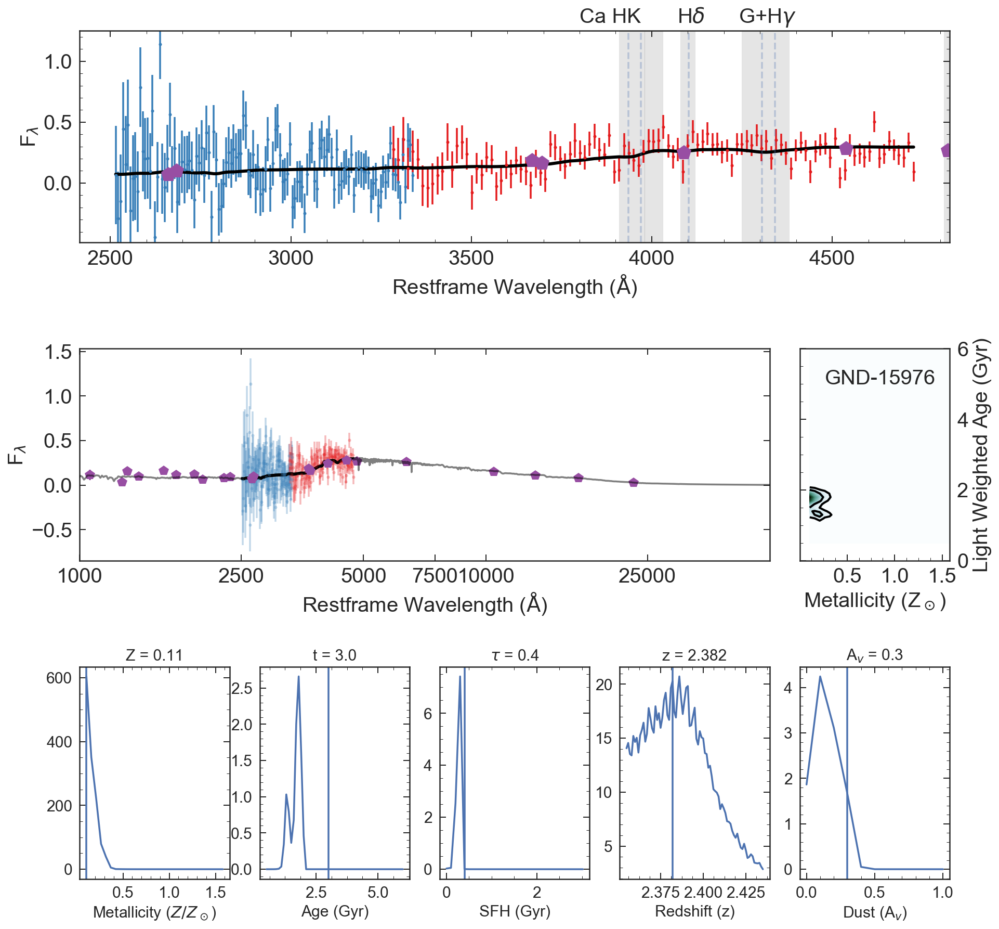

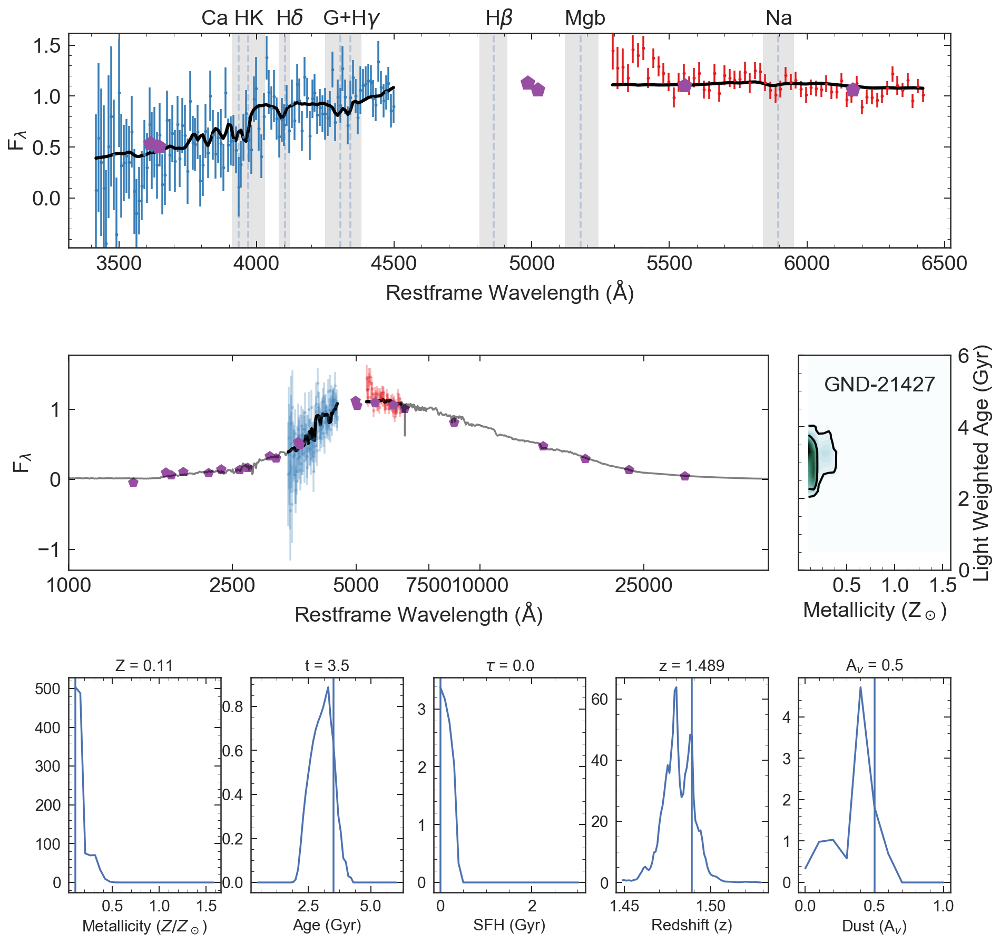

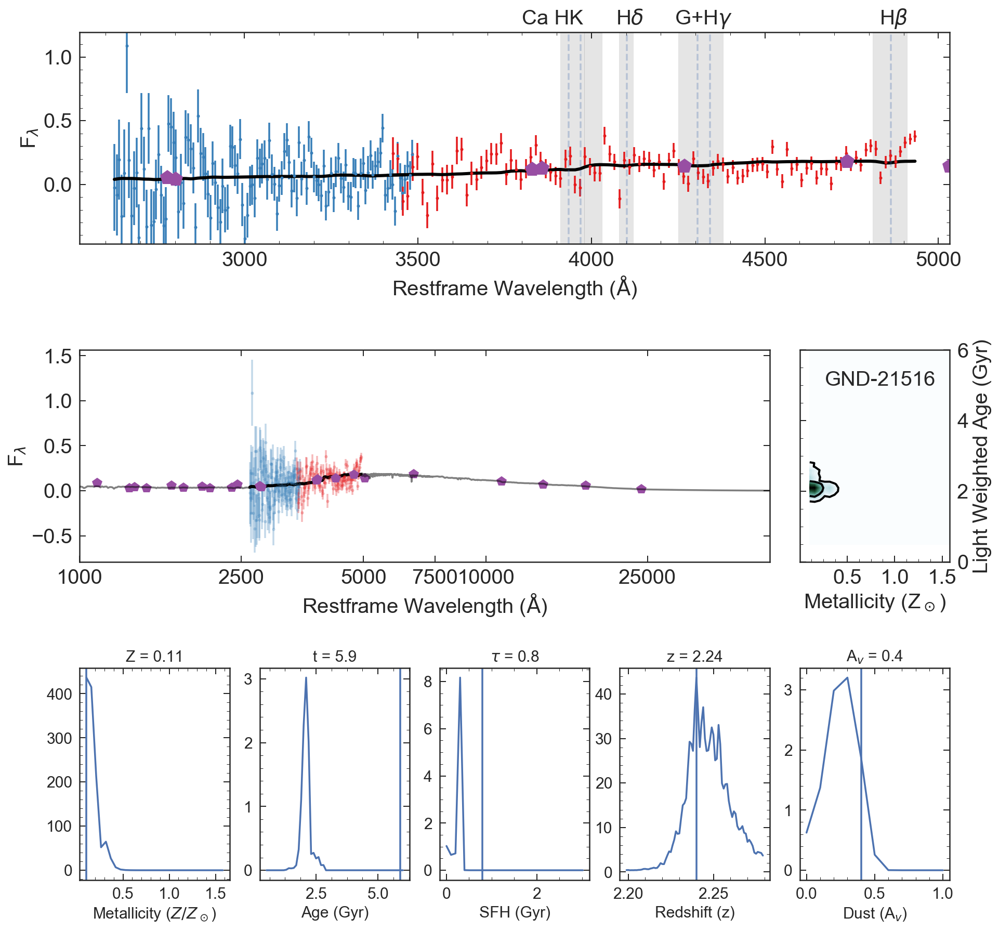

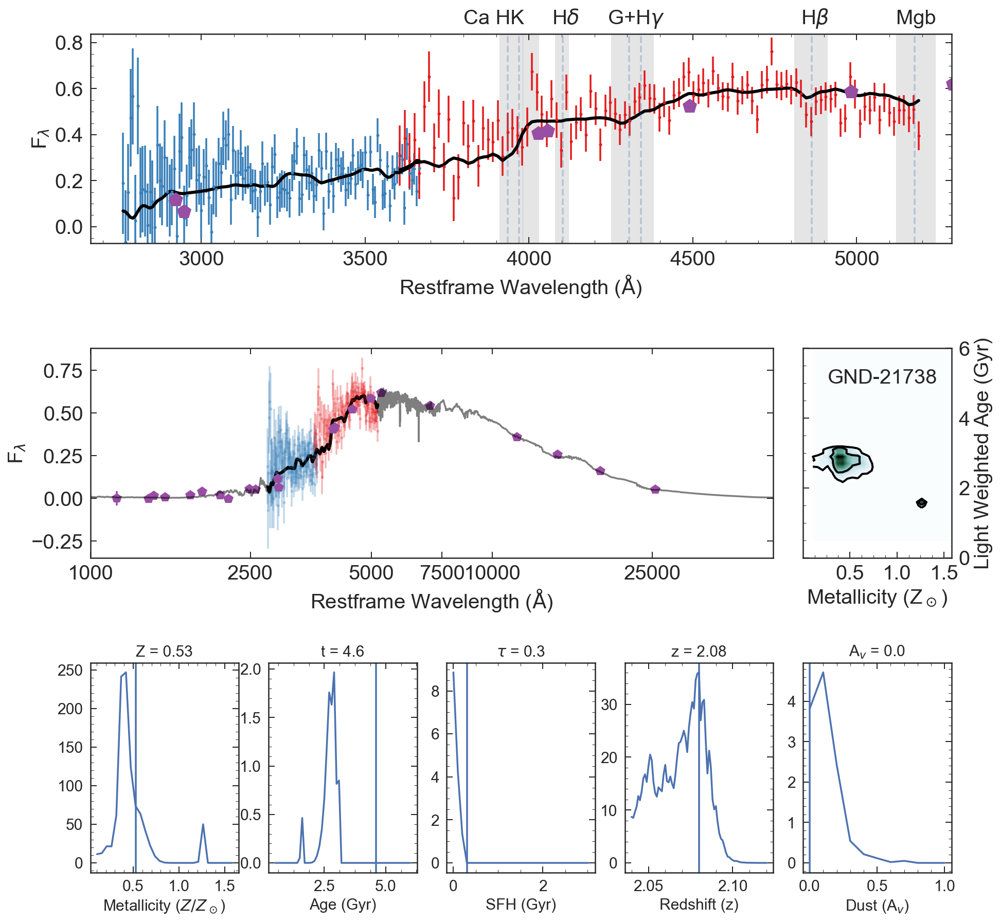

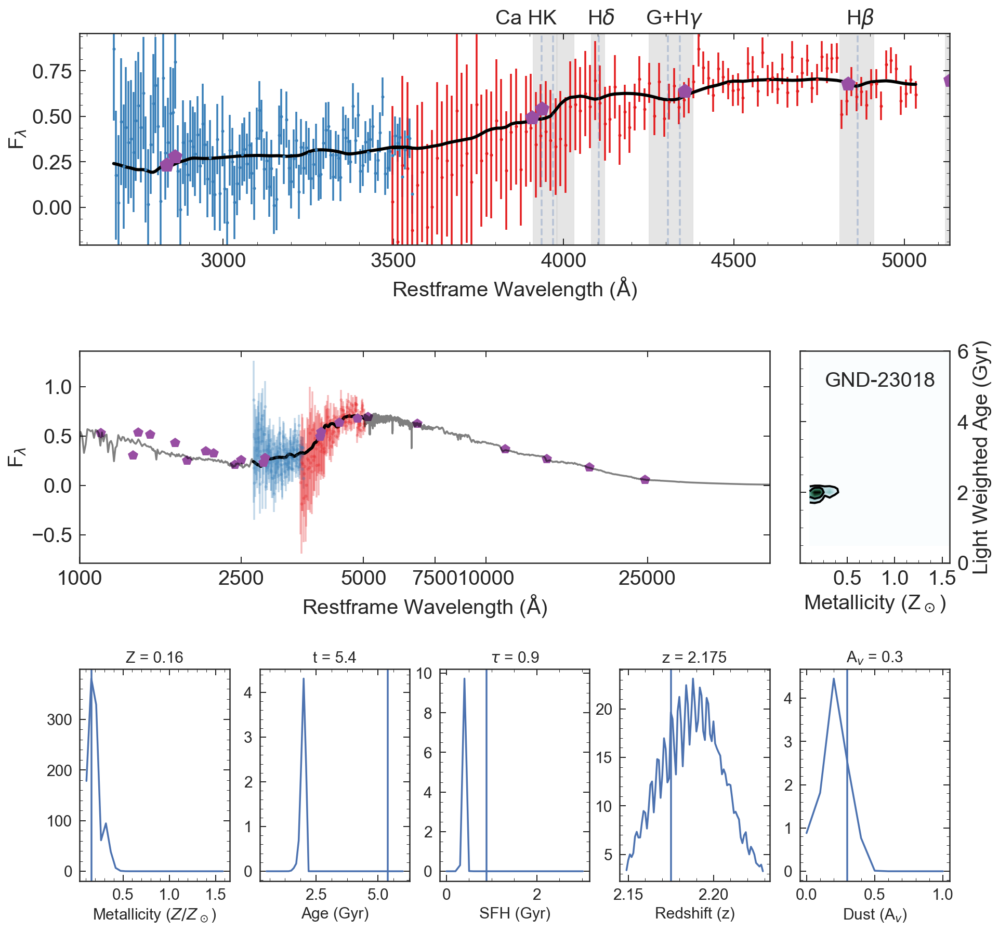

...

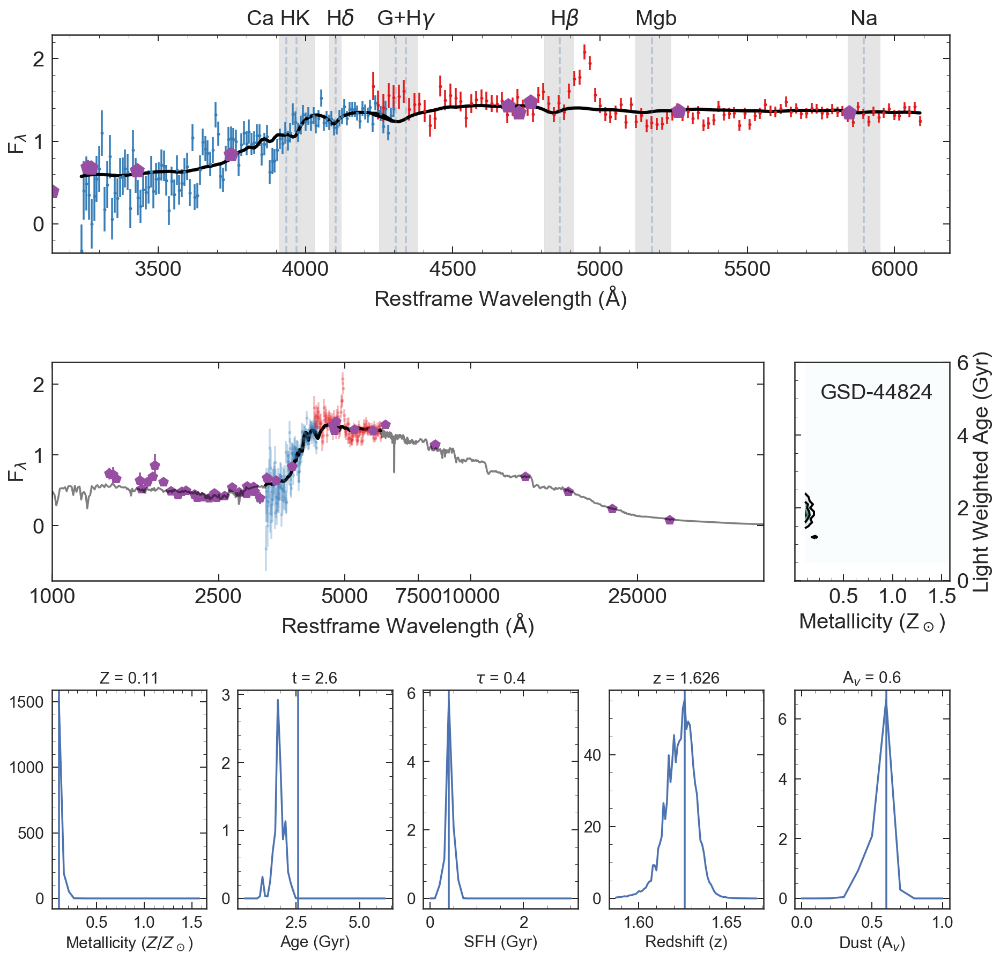

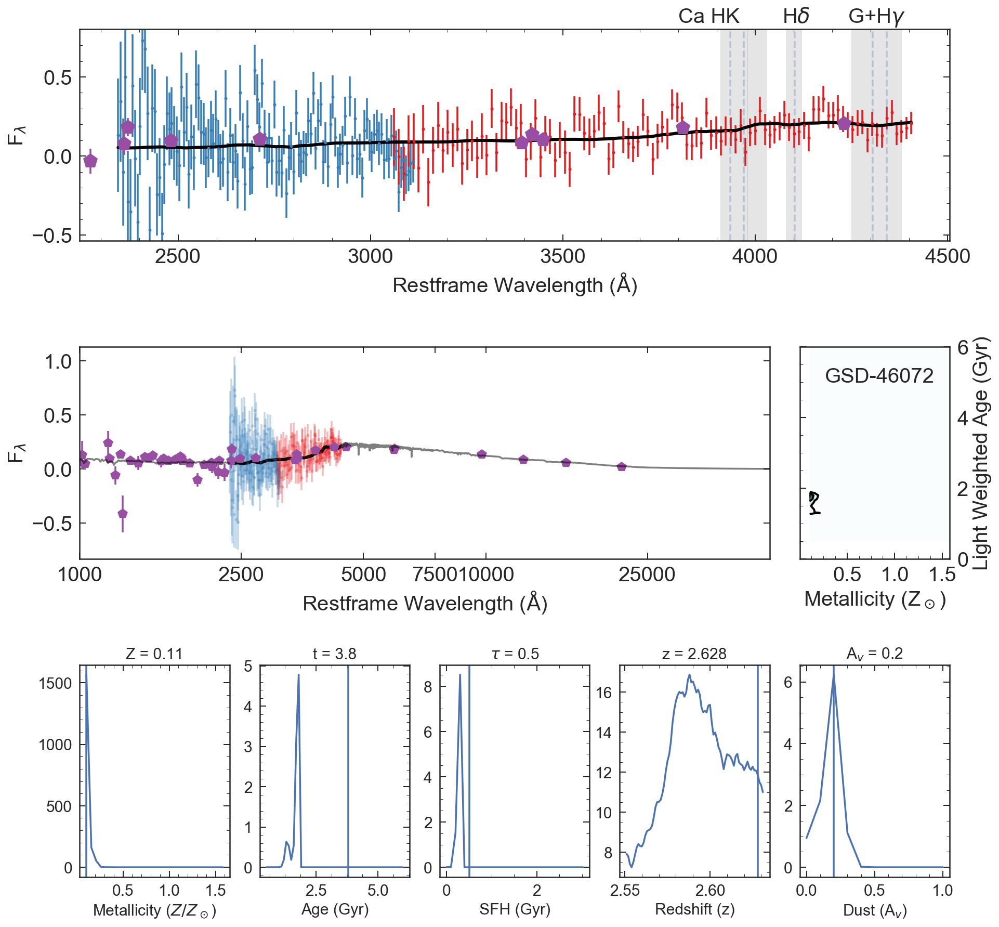

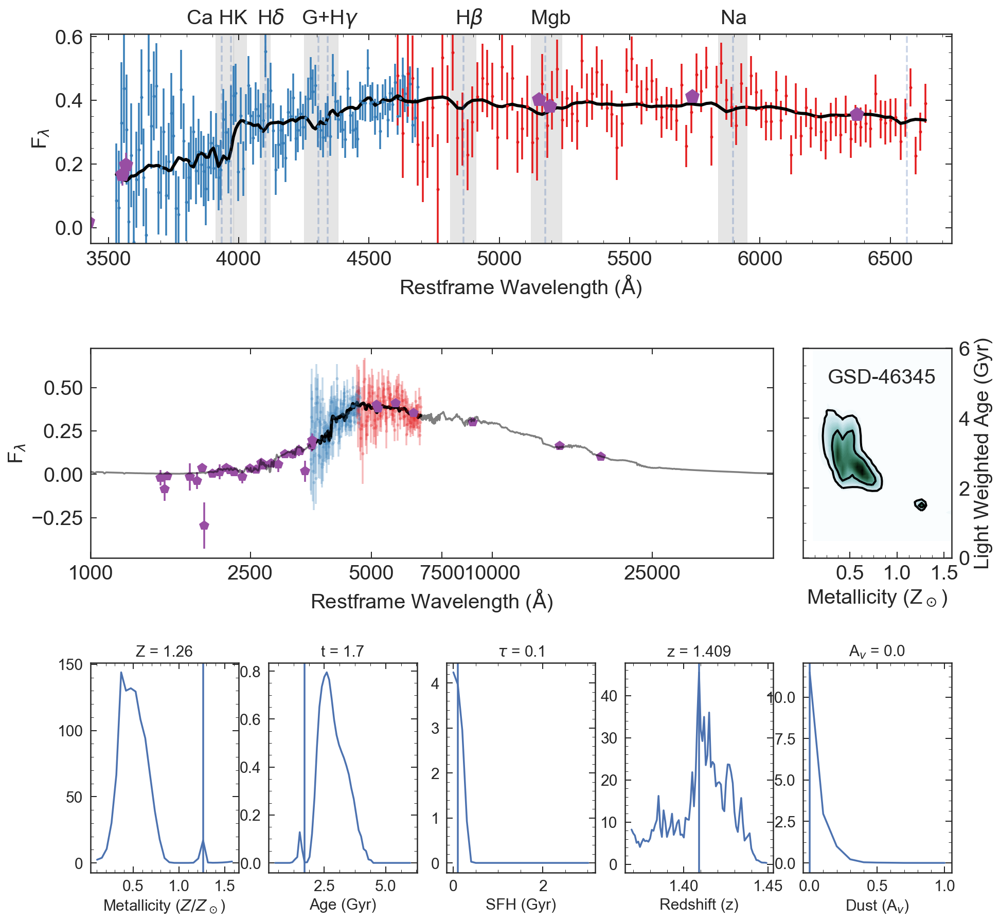

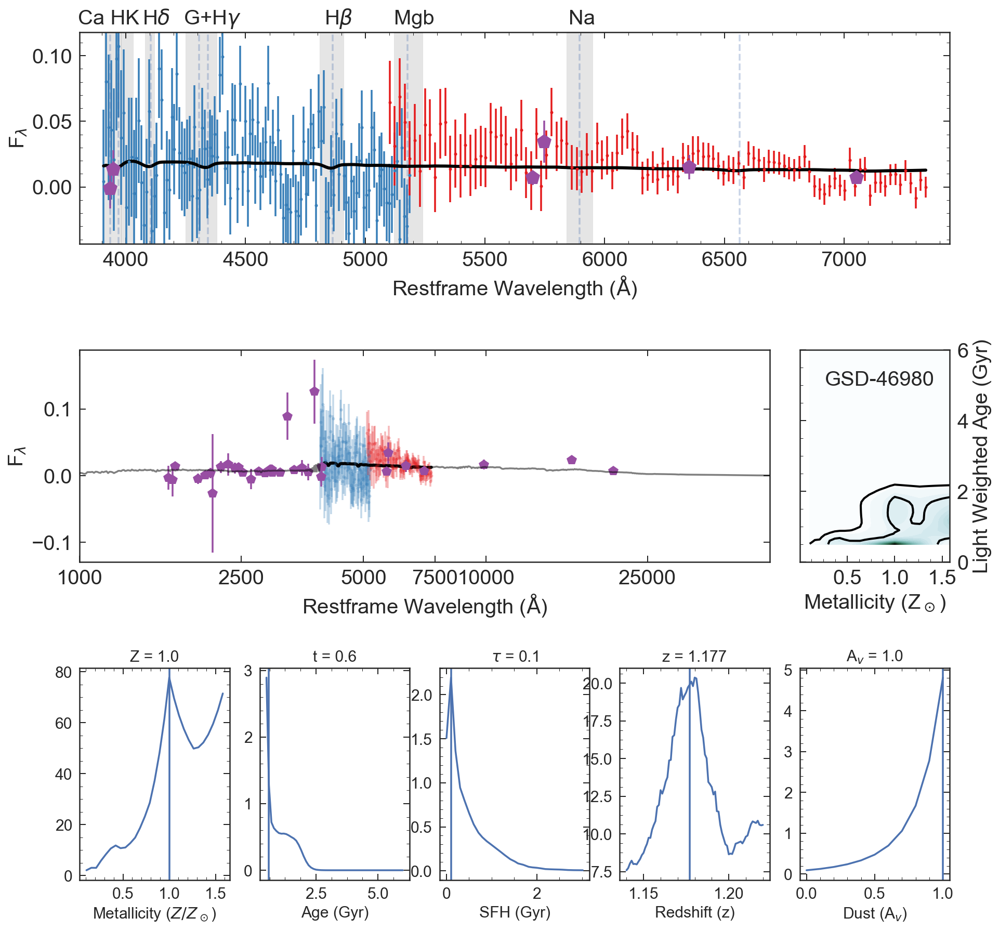

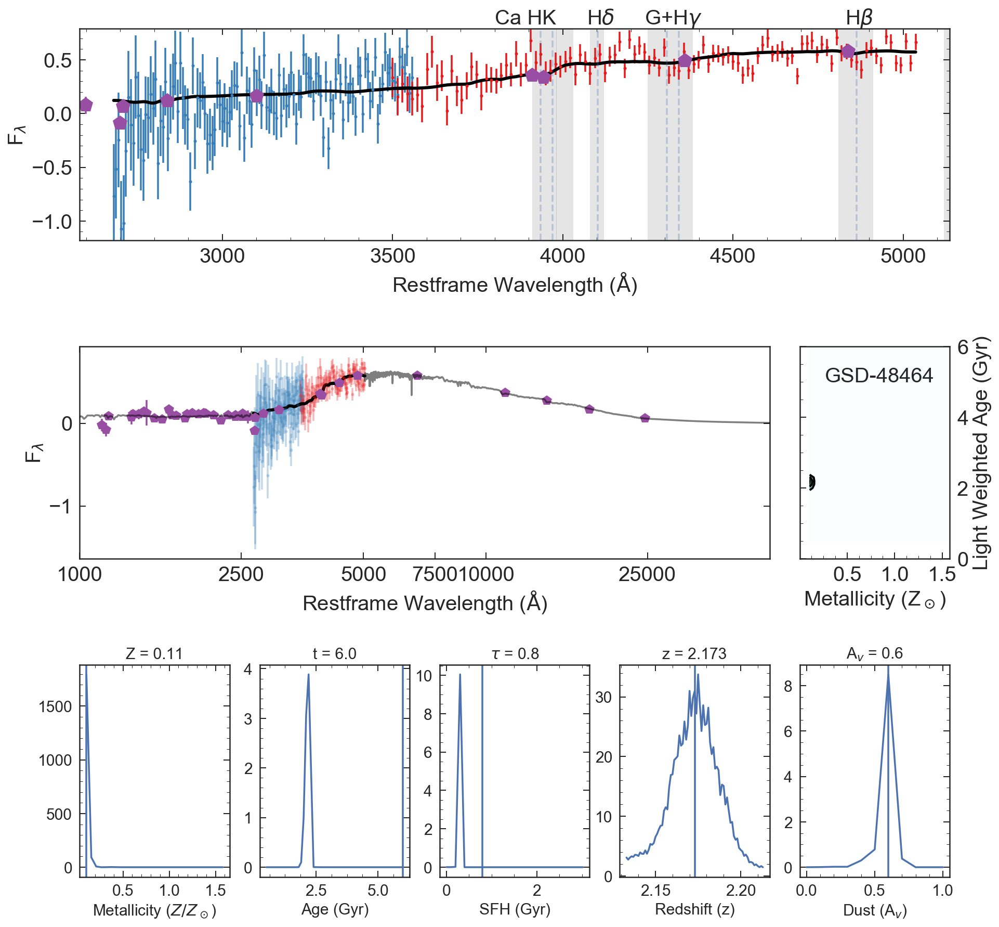

In [12]:
for i in galDB.index:
    idx=i
    Plot_L(galDB.field[idx],galDB.ids[idx],bfZ[gids == galDB.ids[idx]][0], bft[gids == galDB.ids[idx]][0],bftau[gids == galDB.ids[idx]][0],
                            bfz[gids == galDB.ids[idx]][0], bfd[gids == galDB.ids[idx]][0])

/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/grizli-0.6.0_115_g3ce5ccf-py3.5-macosx-10.6-x86_64.egg/grizli/model.py:544: RuntimeWarning: invalid value encountered in true_divide
  self.optimal_profile = m/m.sum(axis=0)
/Users/Vince.ec/miniconda3/envs/astroconda/lib/python3.5/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


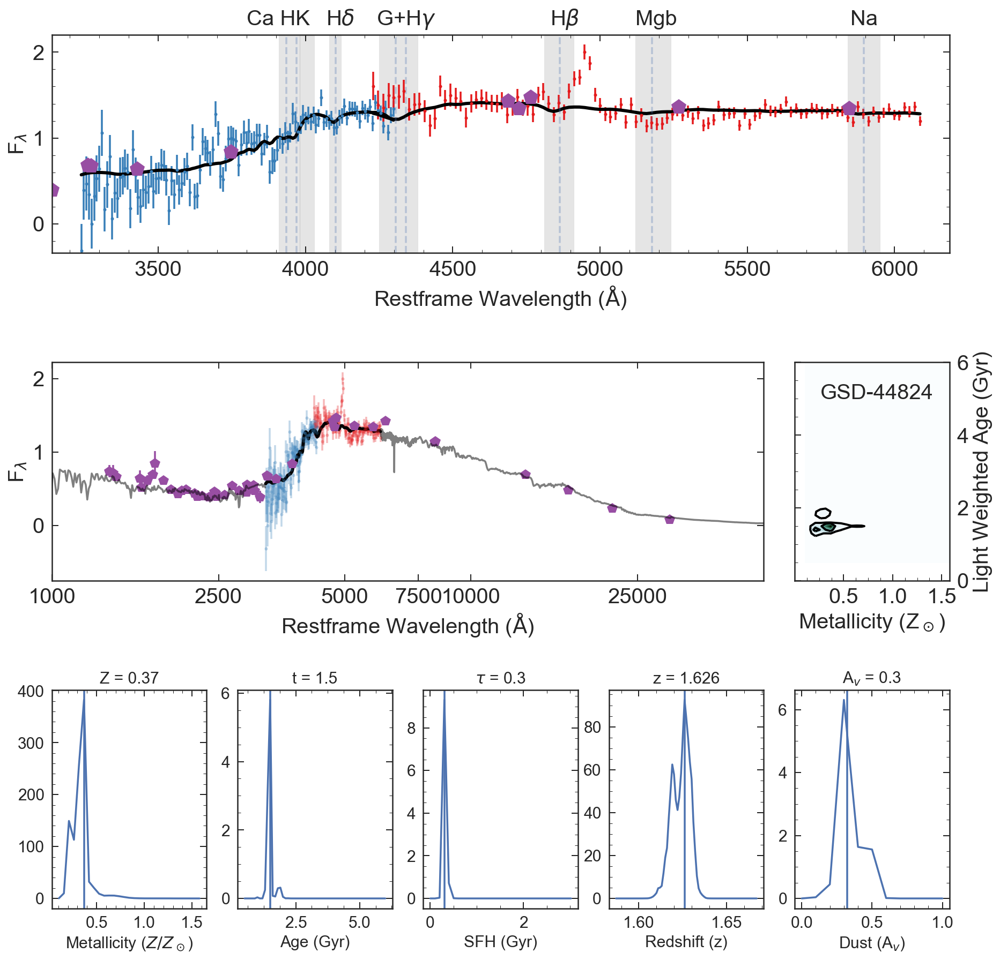

In [20]:
Z,sPZ = np.load('../data/posteriors/fit_all_3_GSD_41520_Z_pos.npy')
t,sPt = np.load('../data/posteriors/fit_all_3_GSD_41520_t_pos.npy')
ult,sPtau = np.load('../data/posteriors/fit_all_3_GSD_41520_tau_pos.npy')
z,sPz = np.load('../data/posteriors/fit_all_3_GSD_41520_rs_pos.npy')
d,sPd = np.load('../data/posteriors/fit_all_3_GSD_41520_d_pos.npy')

Z,PZ = np.load('../data/posteriors/fit_all_2_GSD_41520_Z_pos.npy')
t,Pt = np.load('../data/posteriors/fit_all_2_GSD_41520_t_pos.npy')
ult,Ptau = np.load('../data/posteriors/fit_all_2_GSD_41520_tau_pos.npy')
z,Pz = np.load('../data/posteriors/fit_all_2_GSD_41520_rs_pos.npy')
d,Pd = np.load('../data/posteriors/fit_all_2_GSD_41520_d_pos.npy')

Z,BPZ = np.load('../data/posteriors/fit_all_2_GSD_41520_Z_g102_pos.npy')
t,BPt = np.load('../data/posteriors/fit_all_2_GSD_41520_t_g102_pos.npy')
ult,BPtau = np.load('../data/posteriors/fit_all_2_GSD_41520_tau_g102_pos.npy')
z,BPz = np.load('../data/posteriors/fit_all_2_GSD_41520_rs_g102_pos.npy')
d,BPd = np.load('../data/posteriors/fit_all_2_GSD_41520_d_g102_pos.npy')

Z,RPZ = np.load('../data/posteriors/fit_all_2_GSD_41520_Z_g141_pos.npy')
t,RPt = np.load('../data/posteriors/fit_all_2_GSD_41520_t_g141_pos.npy')
ult,RPtau = np.load('../data/posteriors/fit_all_2_GSD_41520_tau_g141_pos.npy')
z,RPz = np.load('../data/posteriors/fit_all_2_GSD_41520_rs_g141_pos.npy')
d,RPd = np.load('../data/posteriors/fit_all_2_GSD_41520_d_g141_pos.npy')

Z,PPZ = np.load('../data/posteriors/fit_all_2_GSD_41520_Z_phot_pos.npy')
t,PPt = np.load('../data/posteriors/fit_all_2_GSD_41520_t_phot_pos.npy')
ult,PPtau = np.load('../data/posteriors/fit_all_2_GSD_41520_tau_phot_pos.npy')
z,PPz = np.load('../data/posteriors/fit_all_2_GSD_41520_rs_phot_pos.npy')
d,PPd = np.load('../data/posteriors/fit_all_2_GSD_41520_d_phot_pos.npy')

Z,GPZ = np.load('../data/posteriors/fit_all_2_GSD_41520_Z_grism_pos.npy')
t,GPt = np.load('../data/posteriors/fit_all_2_GSD_41520_t_grism_pos.npy')
ult,GPtau = np.load('../data/posteriors/fit_all_2_GSD_41520_tau_grism_pos.npy')
z,GPz = np.load('../data/posteriors/fit_all_2_GSD_41520_rs_grism_pos.npy')
d,GPd = np.load('../data/posteriors/fit_all_2_GSD_41520_d_grism_pos.npy')

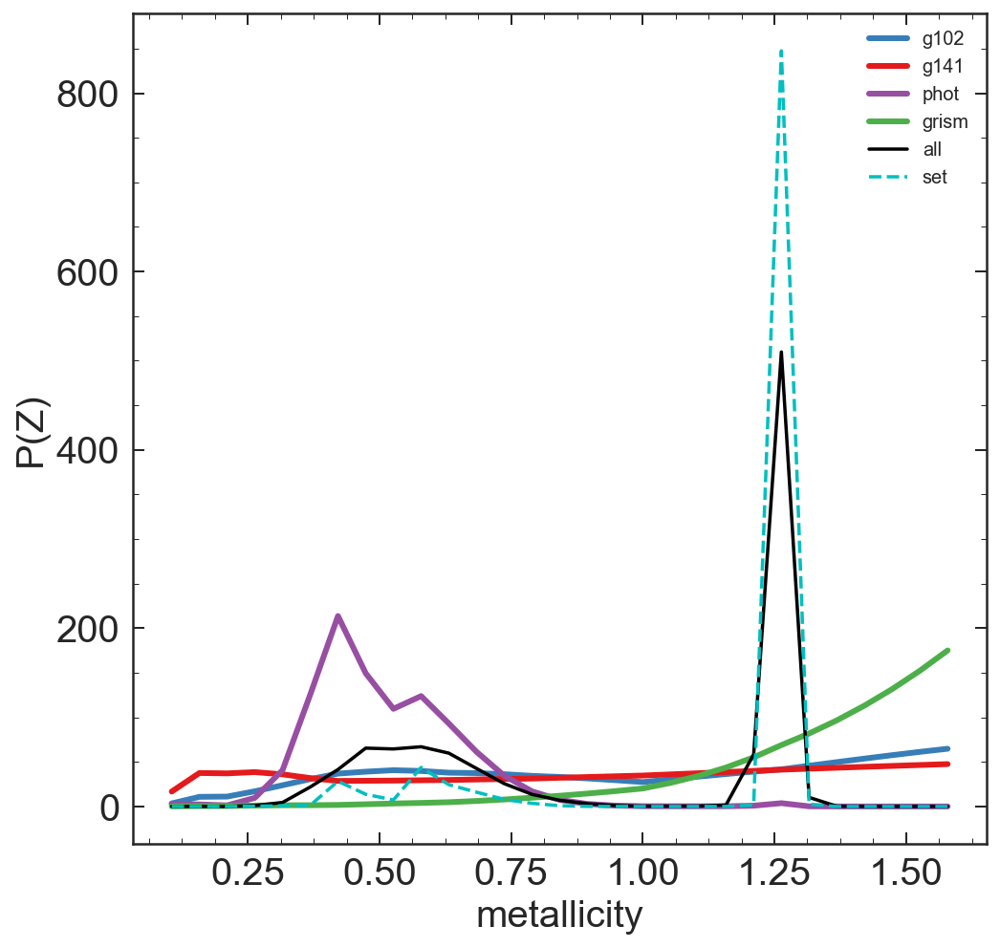

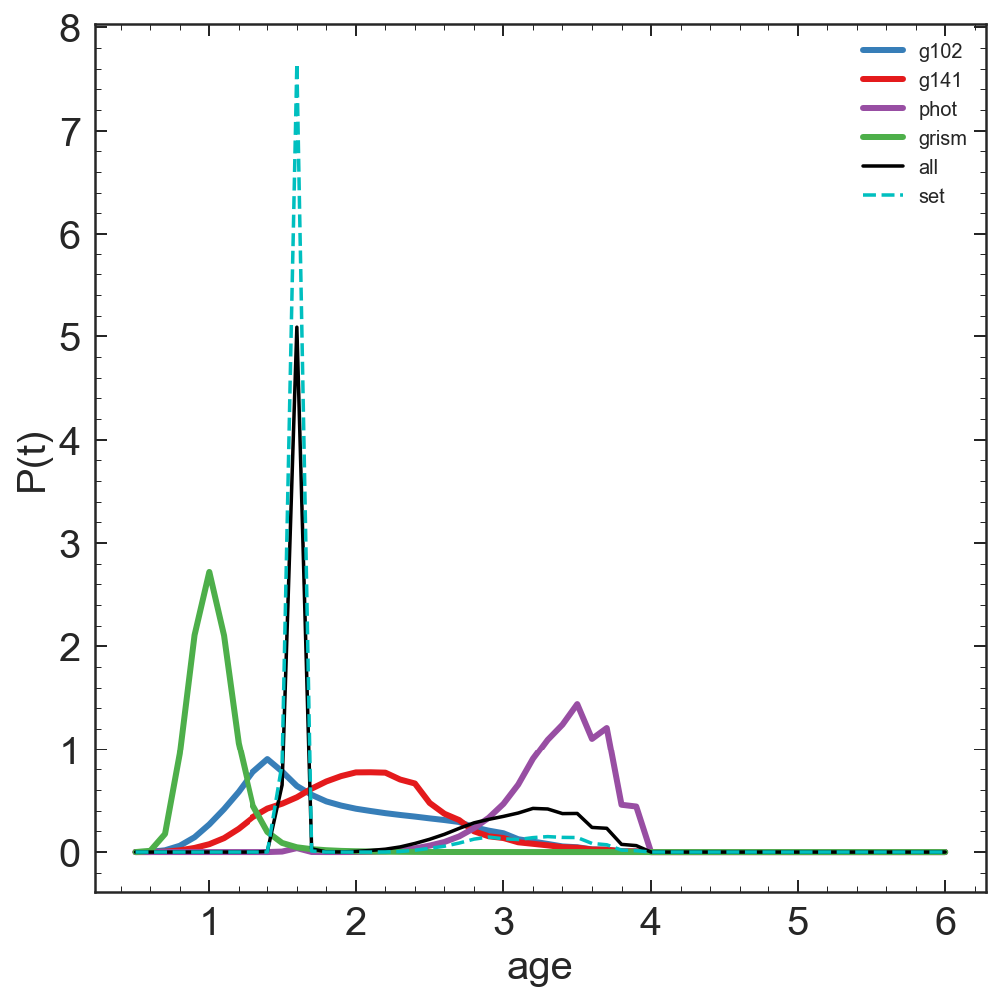

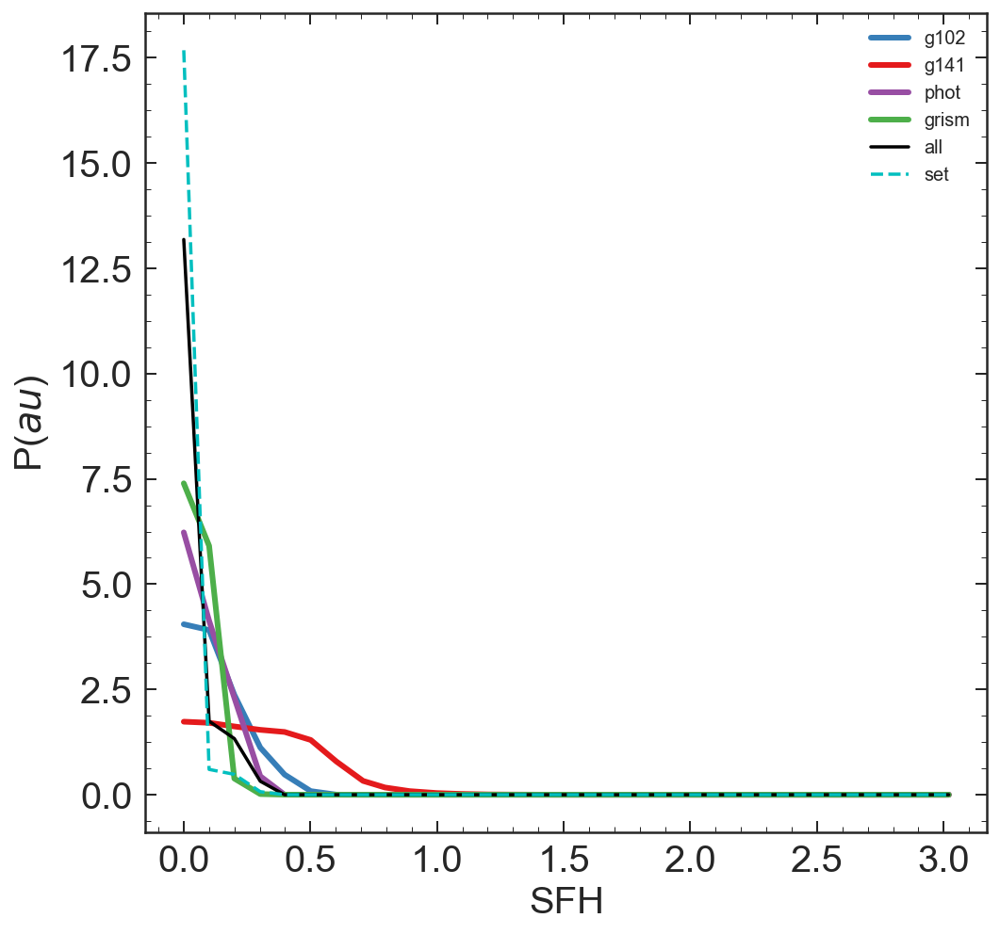

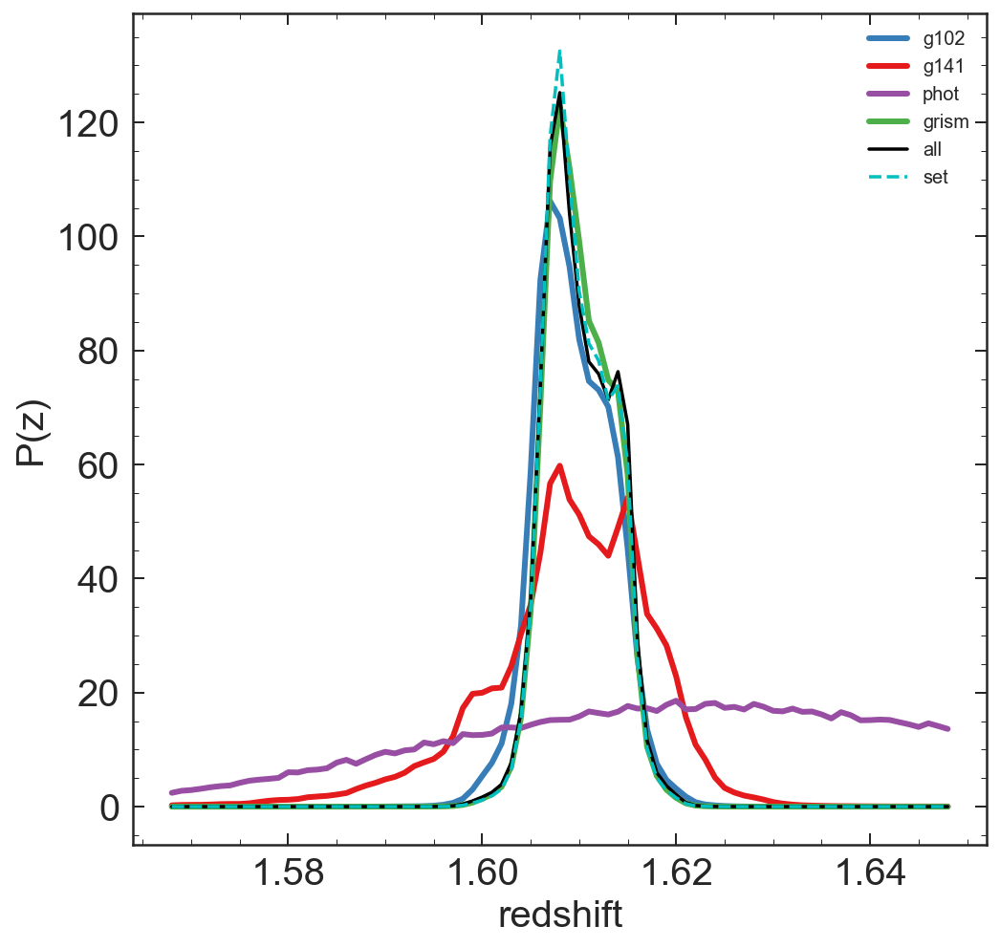

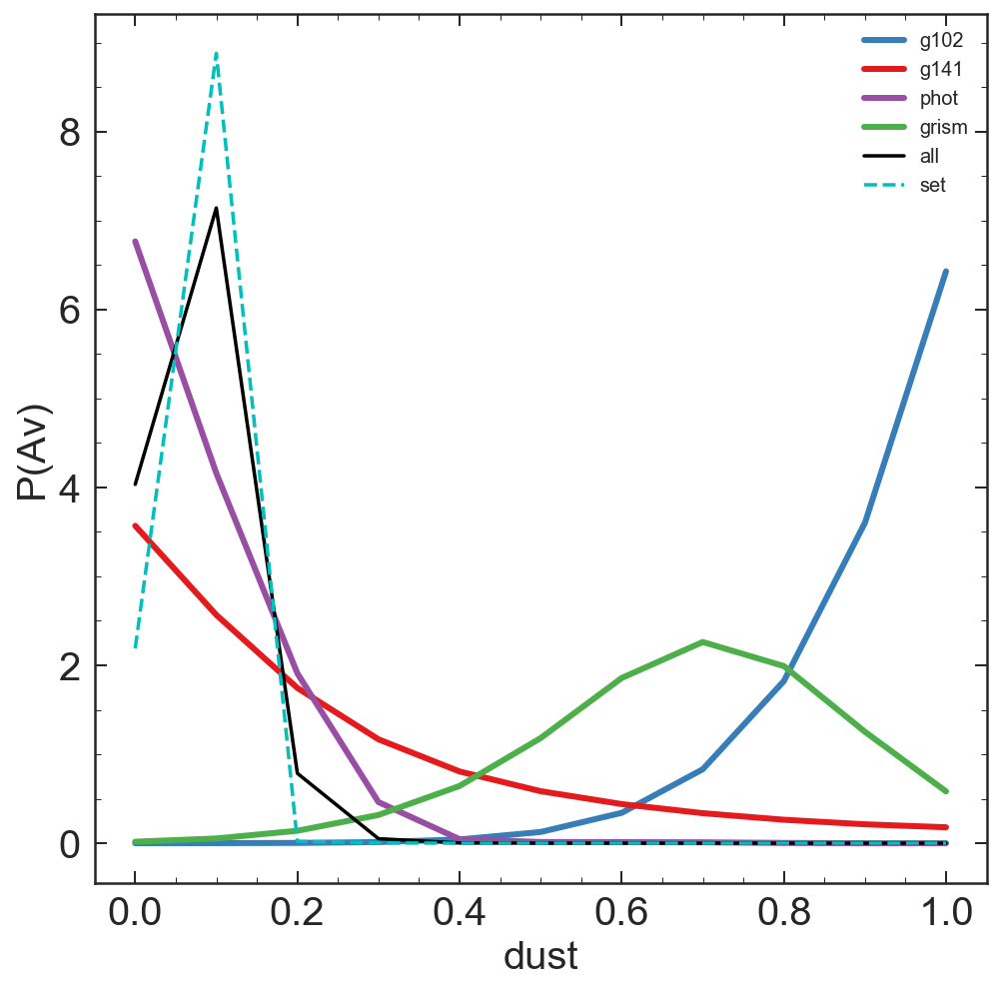

In [24]:
plt.figure(figsize=[8,8])
plt.plot(Z/0.019 ,BPZ, linewidth = 3, color='#377eb8', label = 'g102')
plt.plot(Z/0.019 ,RPZ, linewidth = 3, color='#e41a1c', label = 'g141')
plt.plot(Z/0.019 ,PPZ, linewidth = 3, color='#984ea3', label = 'phot')
plt.plot(Z/0.019 ,GPZ, linewidth = 3, color='#4daf4a', label = 'grism')
plt.plot(Z/0.019 ,PZ, color='k', label = 'all')
plt.plot(Z/0.019 ,sPZ, '--', color='c', label = 'set')
plt.xlabel('metallicity', fontsize=20)
plt.ylabel('P(Z)', fontsize=20)
plt.legend()
plt.tick_params(axis='both', which='major', labelsize=20)

plt.figure(figsize=[8,8])
plt.plot(t ,BPt, linewidth = 3, color='#377eb8', label = 'g102')
plt.plot(t ,RPt, linewidth = 3, color='#e41a1c', label = 'g141')
plt.plot(t ,PPt, linewidth = 3, color='#984ea3', label = 'phot')
plt.plot(t ,GPt, linewidth = 3, color='#4daf4a', label = 'grism')
plt.plot(t ,Pt, color='k', label = 'all')
plt.plot(t ,sPt, '--', color='c', label = 'set')
plt.xlabel('age', fontsize=20)
plt.ylabel('P(t)', fontsize=20)
plt.legend()
plt.tick_params(axis='both', which='major', labelsize=20)

plt.figure(figsize=[8,8])
plt.plot(ult ,BPtau, linewidth = 3, color='#377eb8', label = 'g102')
plt.plot(ult ,RPtau, linewidth = 3, color='#e41a1c', label = 'g141')
plt.plot(ult ,PPtau, linewidth = 3, color='#984ea3', label = 'phot')
plt.plot(ult ,GPtau, linewidth = 3, color='#4daf4a', label = 'grism')
plt.plot(ult ,Ptau, color='k', label = 'all')
plt.plot(ult ,sPtau, '--', color='c', label = 'set')
plt.xlabel('SFH', fontsize=20)
plt.ylabel('P($\tau$)', fontsize=20)
plt.legend()
plt.tick_params(axis='both', which='major', labelsize=20)

plt.figure(figsize=[8,8])
plt.plot(z ,BPz, linewidth = 3, color='#377eb8', label = 'g102')
plt.plot(z ,RPz, linewidth = 3, color='#e41a1c', label = 'g141')
plt.plot(z ,PPz, linewidth = 3, color='#984ea3', label = 'phot')
plt.plot(z ,GPz, linewidth = 3, color='#4daf4a', label = 'grism')
plt.plot(z ,Pz, color='k', label = 'all')
plt.plot(z ,sPz, '--', color='c', label = 'set')
plt.xlabel('redshift', fontsize=20)
plt.ylabel('P(z)', fontsize=20)
plt.legend()
plt.tick_params(axis='both', which='major', labelsize=20)

plt.figure(figsize=[8,8])
plt.plot(d ,BPd, linewidth = 3, color='#377eb8', label = 'g102')
plt.plot(d ,RPd, linewidth = 3, color='#e41a1c', label = 'g141')
plt.plot(d ,PPd, linewidth = 3, color='#984ea3', label = 'phot')
plt.plot(d ,GPd, linewidth = 3, color='#4daf4a', label = 'grism')
plt.plot(d ,Pd, color='k', label = 'all')
plt.plot(d ,sPd, '--', color='c', label = 'set')
plt.xlabel('dust', fontsize=20)
plt.ylabel('P(Av)', fontsize=20)
plt.legend()
plt.tick_params(axis='both', which='major', labelsize=20)

In [120]:
age[np.round(LWA,1) == galDB.t[idx]]

array([2.4])